## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.


In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from ipywidgets import interact, interactive, fixed

# %matplotlib qt
%matplotlib inline

# Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.

Create a list for the object points, and image points. Loop through all the calibration images, when we find chessboard corners we add those image points and object points to the lists and do it again.

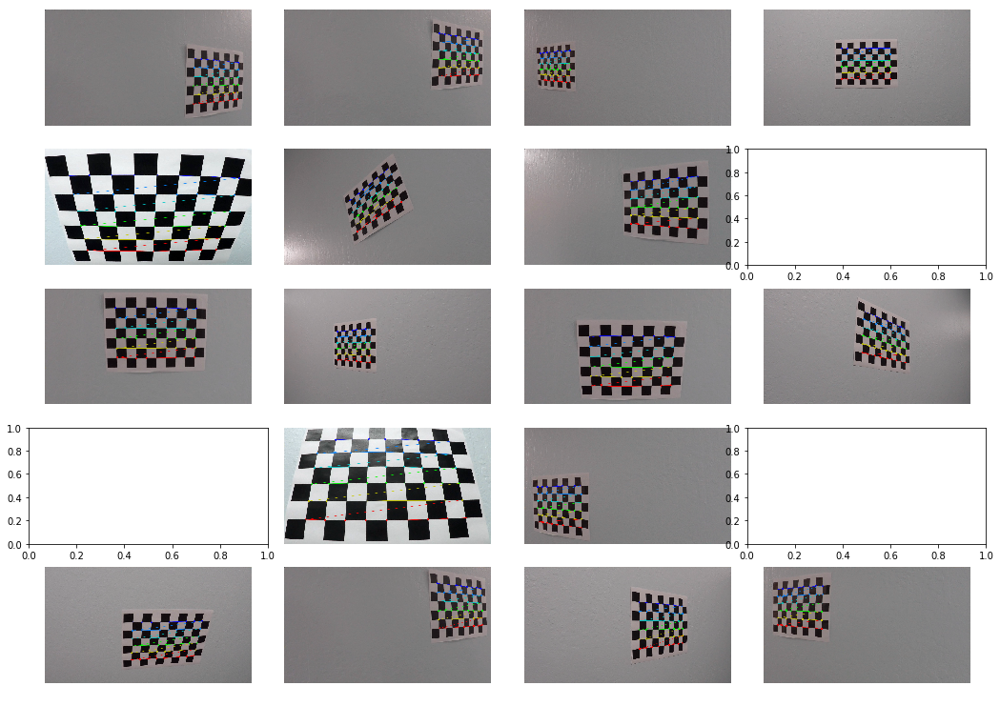

In [2]:
# prepare object points
nx = 9 #enter the number of inside corners in x(any row)
ny = 6 #enter the number of inside corners in y(any column)

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((ny * nx, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

fig, axs = plt.subplots(5, 4, figsize=(18, 13))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

# Step through the list of images and search for chessboard corners in each one
for i, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, add object points, image points to the lists
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        
        axs[i].axis('off')
        axs[i].imshow(img)

*** We can see that some of the images do not show because the chessboard corners were not found (ret == False).

#### Use the object and image point lists from the chessboards above to calibrate the camera

In [3]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, 
                                                   imgpoints, 
                                                   gray.shape[::-1], 
                                                   None, 
                                                   None)

# Image Distortion Correction

We can use the cv2.undistort function to undistort our images based on our camera calibration from above

Here's a helper function to do just that

In [4]:
def undistort(img, mtx, dist):
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

Let's test it out on one of the chessboard images and see what it looks like after it's undistorted

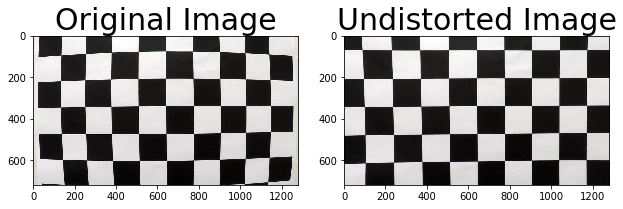

In [5]:
fname = '../camera_cal/calibration1.jpg'

img = mpimg.imread(fname)

# Use the undistort function, with the mtx and dist calculated above
undist = undistort(img, mtx, dist)

### print an example plot of a comparison of a distorted and undistorted image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 5))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

Well you can definitely see a difference! And the lines seem pretty straight to me.

Let's try it on an image taken from a car video.

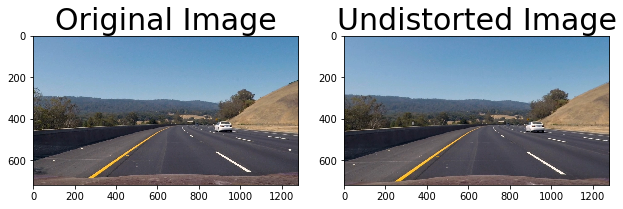

In [6]:
fname = '../test_images/test3.jpg'

img = mpimg.imread(fname)

# Use the undistort function, with the mtx and dist calculated above
undist = undistort(img, mtx, dist)

### print an example plot of a comparison of a distorted and undistorted image
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 5))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(undist)
ax2.set_title('Undistorted Image', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


You can see the difference in the hood of the car and that sign on the left

#  Perspective Transform

In [7]:
def add_lines(img, src):
    img2 = np.copy(img)
    color = [255, 0, 0] # Red
    thickness = 2
    x0, y0 = src[0]
    x1, y1 = src[1]
    x2, y2 = src[2]
    x3, y3 = src[3]
    cv2.line(img2, (x0, y0), (x1, y1), color, thickness)
    cv2.line(img2, (x1, y1), (x2, y2), color, thickness)
    cv2.line(img2, (x2, y2), (x3, y3), color, thickness)
    cv2.line(img2, (x3, y3), (x0, y0), color, thickness)
    return img2

In [8]:
h, w = img.shape[:2]

# Points for the original image
src = np.float32([
    [210, 700],
    [570, 460], 
    [705, 460], 
    [1075, 700]
])
# Points for the new image
dst = np.float32([
    [400, 720],
    [400, 0], 
    [w-400, 0], 
    [w-400, 720]
])


def warper(img):
    
    # Compute and apply perpective transform
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_NEAREST)  # keep same size as input image

    return warped

def unwarp(img):
    
    # Compute and apply inverse perpective transform
    img_size = (img.shape[1], img.shape[0])
    Minv = cv2.getPerspectiveTransform(dst, src)
    unwarped = cv2.warpPerspective(img, Minv, img_size, flags=cv2.INTER_NEAREST)
    
    return unwarped

### Test these functions on pictures with straight lane lines

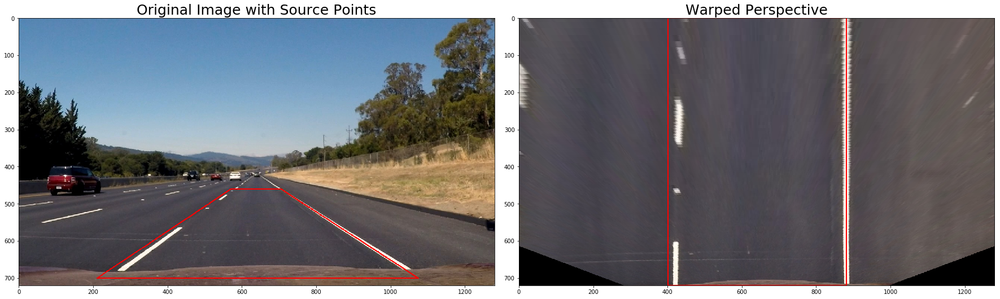

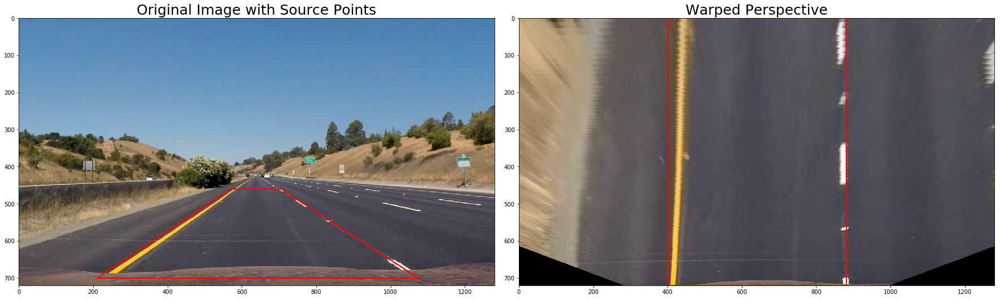

In [9]:
### get the straight test images from the test_images folder
images = glob.glob('../test_images/straight*.jpg')

for fname in images:
    
    img = mpimg.imread(fname)
    
    # Undistort the image based on the camera calibration
    undist = undistort(img, mtx, dist)
    
    # warp the image
    warped = warper(undist)

    src_points_img = add_lines(img, src)

    dst_points_warped = add_lines(warped, dst)

    ### Plot the source points on the original image and the warped image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(src_points_img)
    ax1.set_title('Original Image with Source Points', fontsize=25)
    ax2.imshow(dst_points_warped)
    ax2.set_title('Warped Perspective', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

The values for the src and dst points looks to make these lines pretty straight.

### Test the functions on curved lines

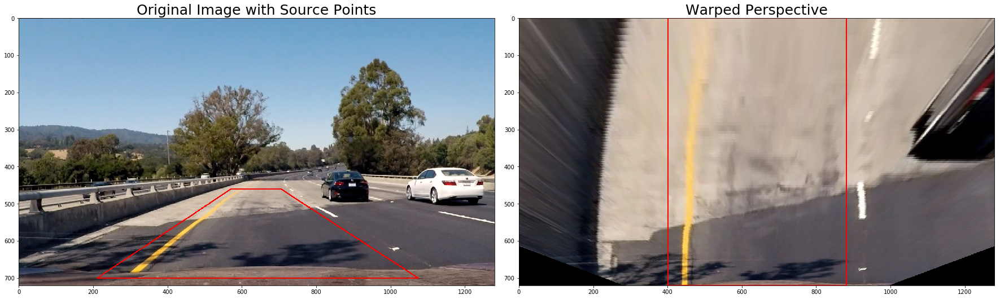

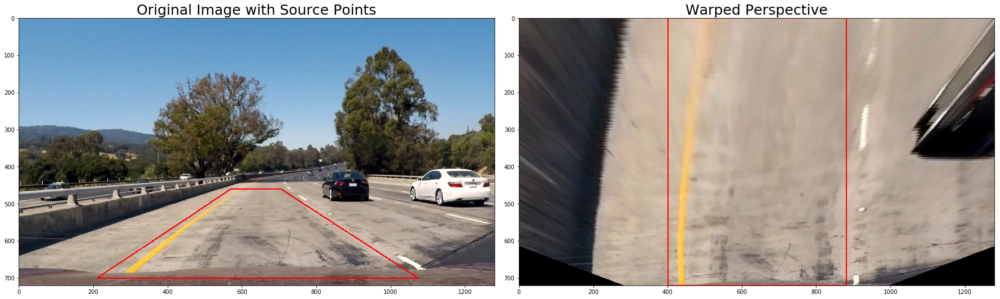

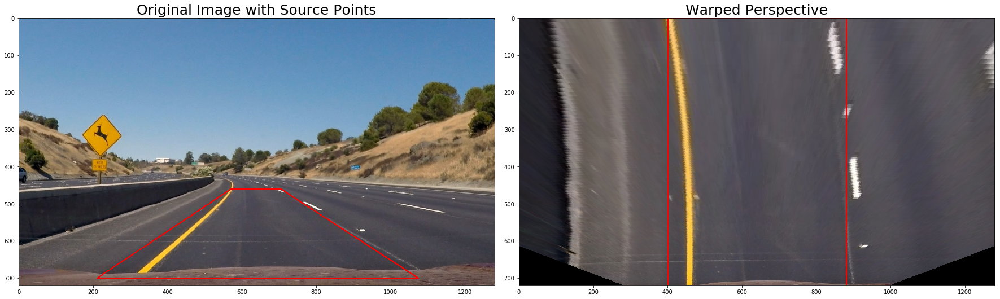

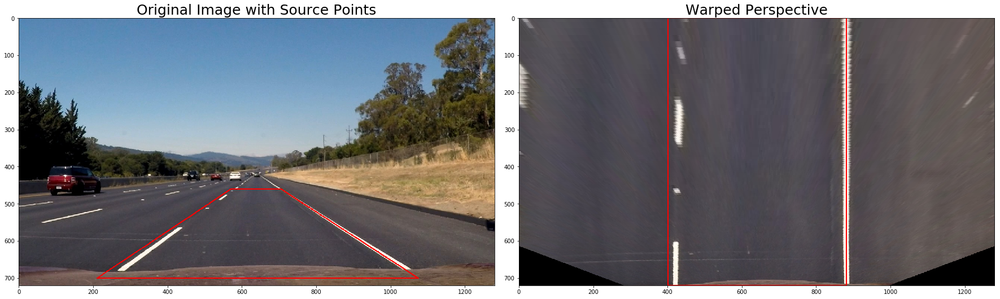

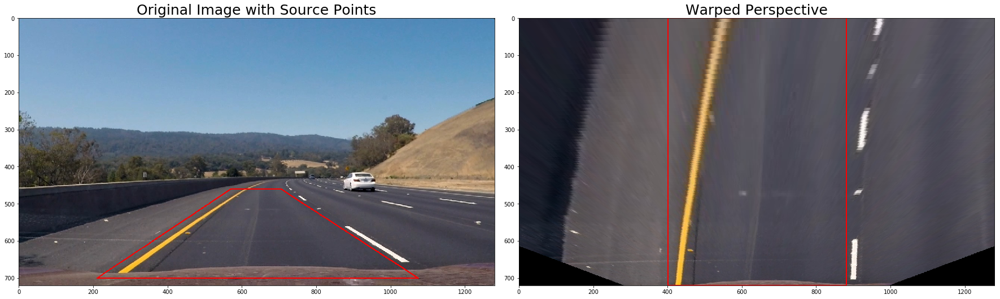

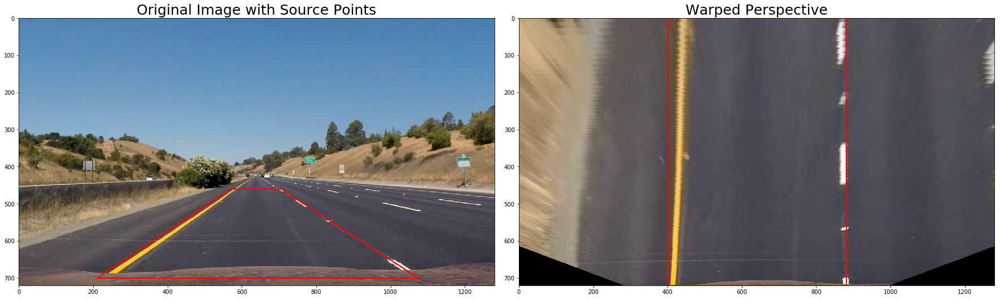

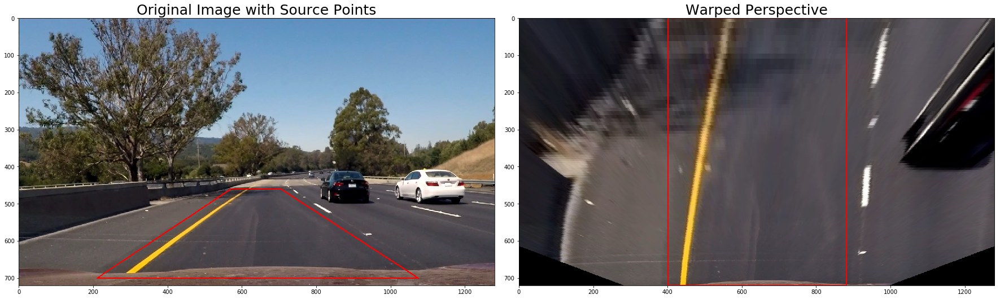

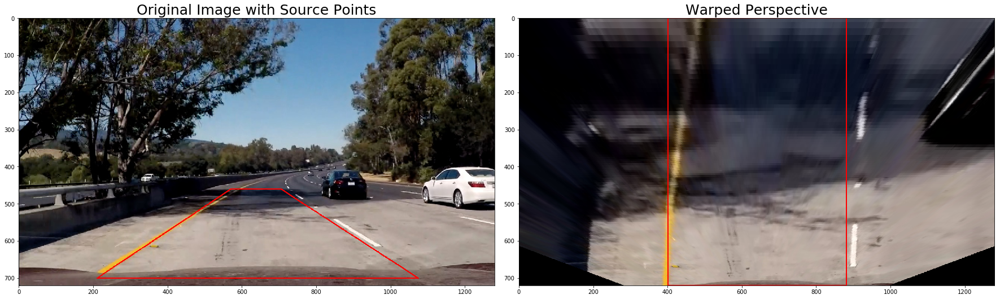

In [10]:
### get the straight test images from the test_images folder
images = glob.glob('../test_images/*.jpg')

for fname in images:
    
    img = mpimg.imread(fname)
    
    # Undistort the image based on the camera calibration
    undist = undistort(img, mtx, dist)

    # warp the image
    warped = warper(undist)

    src_points_img = add_lines(img, src)

    dst_points_warped = add_lines(warped, dst)

    ### Plot the source points on the original image and the warped image
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(src_points_img)
    ax1.set_title('Original Image with Source Points', fontsize=25)
    ax2.imshow(dst_points_warped)
    ax2.set_title('Warped Perspective', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

# Color Selection

We can easily convert between color spaces using OpenCV. Using this, we can pull out the individual channels from each color space, and see if it better isolates the laneline pixels

Clearly some of these channels perform better than others. Let's just look at the good ones.

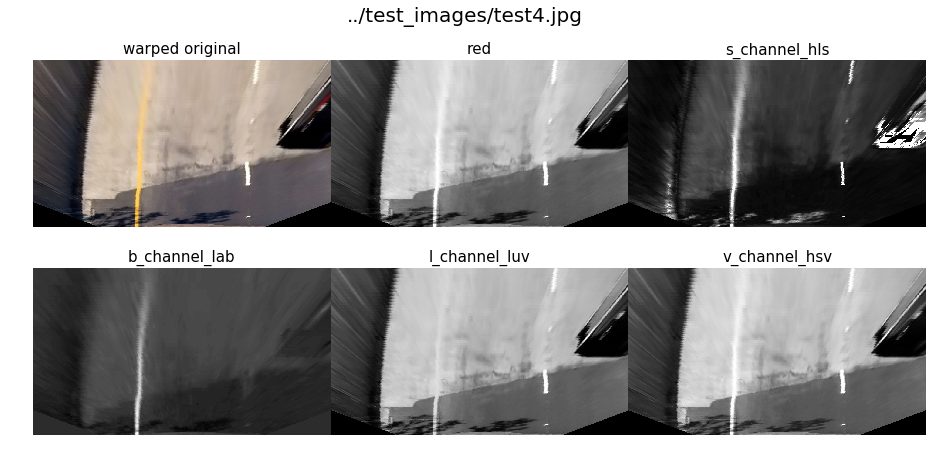

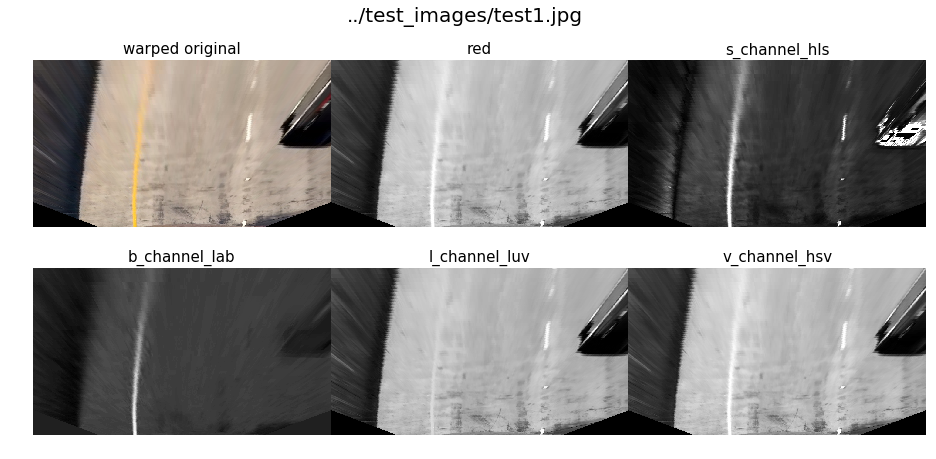

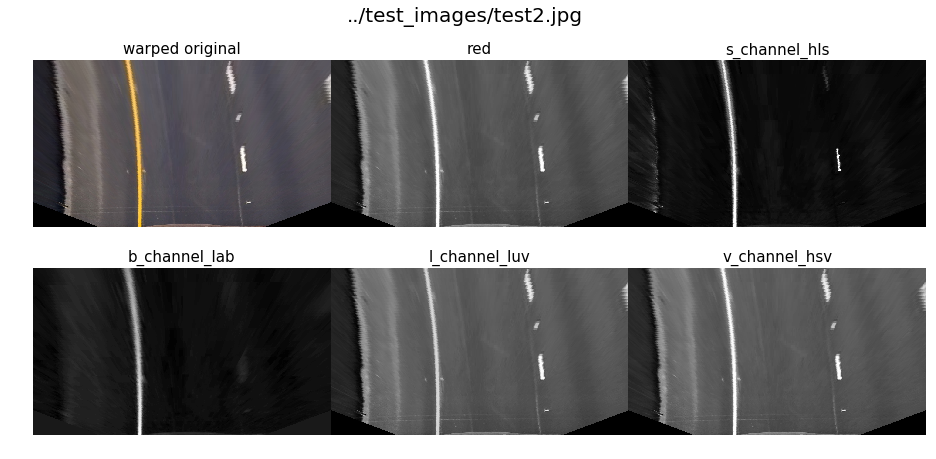

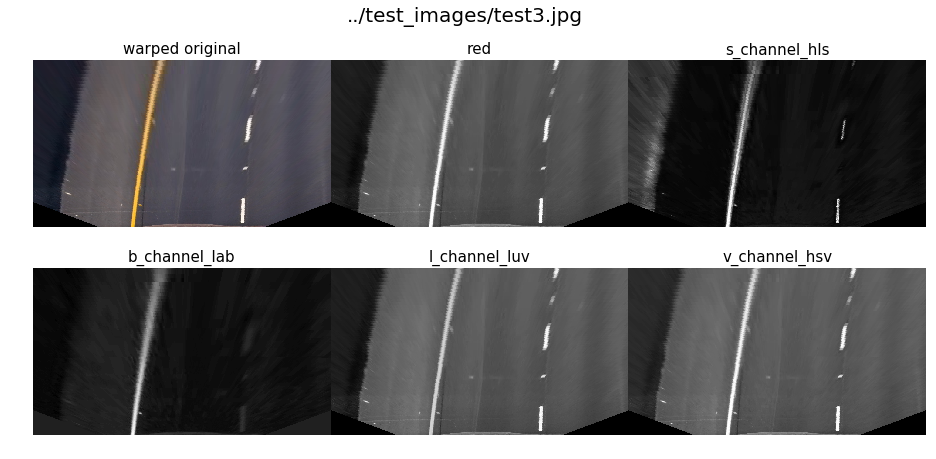

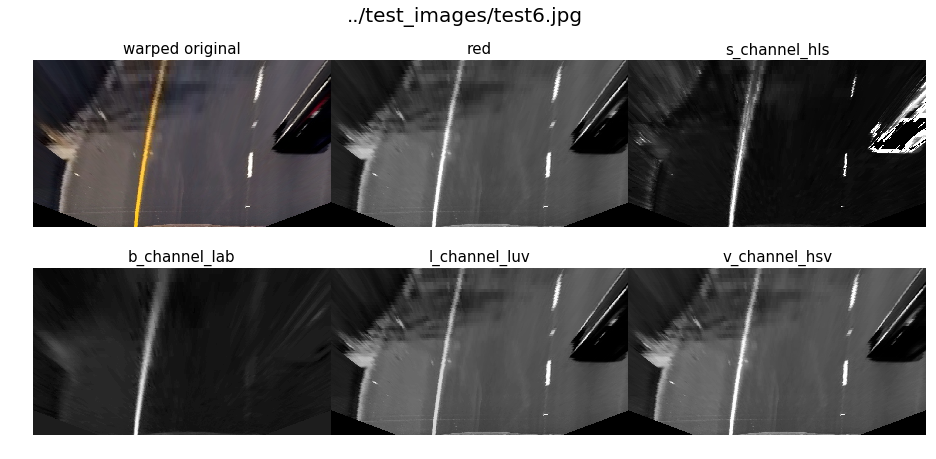

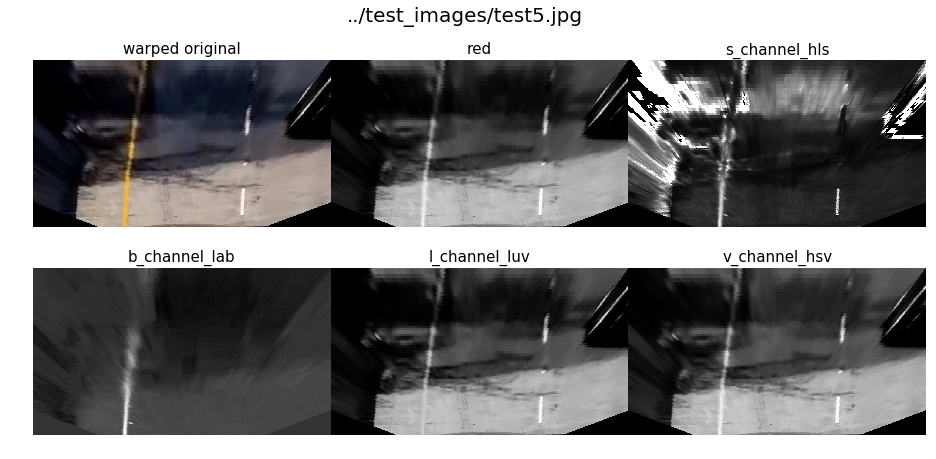

In [11]:
### get the test images from the test_images folder
images = glob.glob('../test_images/test*.jpg')

### Loop through each image and send it to the pipeline
for fname in images:
    
    img = mpimg.imread(fname)
    # Undistort the image based on the camera calibration
    undist = undistort(img, mtx, dist)
    # warp the image
    warped = warper(undist)

    # Separate the RGB
    R = warped[:,:,0]
    G = warped[:,:,1]
    B = warped[:,:,2]

    # Convert to HLS color space
    hls = cv2.cvtColor(warped, cv2.COLOR_RGB2HLS).astype(np.float)
    h_channel_hls = hls[:,:,0]
    l_channel_hls = hls[:,:,1]
    s_channel_hls = hls[:,:,2]

    # Convert to HSV color space
    hsv = cv2.cvtColor(warped, cv2.COLOR_RGB2HSV).astype(np.float)
    h_channel_hsv = hsv[:,:,0]
    s_channel_hsv = hsv[:,:,1]
    v_channel_hsv = hsv[:,:,2]

    # Convert to LAB color space
    lab = cv2.cvtColor(warped, cv2.COLOR_RGB2Lab).astype(np.float)
    l_channel_lab = lab[:,:,0]
    a_channel_lab = lab[:,:,1]
    b_channel_lab = lab[:,:,2]
    
    # Convert to LUV color space
    luv = cv2.cvtColor(warped, cv2.COLOR_RGB2Luv).astype(np.float)
    l_channel_luv = luv[:,:,0]
    u_channel_luv = luv[:,:,1]
    v_channel_luv = luv[:,:,2]
    
    ### Plot the source points on the original image and the warped image
    f, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16, 7))
    f.suptitle(fname, fontsize=20)

    ax1.imshow(warped)
    ax1.set_title('warped original', fontsize=15)
    ax1.axis('off')
    
    ax3.imshow(s_channel_hls, cmap='gray')
    ax3.set_title('s_channel_hls', fontsize=15)
    ax3.axis('off')

    ax2.imshow(R, cmap='gray')
    ax2.set_title('red', fontsize=15)
    ax2.axis('off')

    ax4.imshow(b_channel_lab, cmap='gray')
    ax4.set_title('b_channel_lab', fontsize=15)
    ax4.axis('off')
    
    ax5.imshow(l_channel_luv, cmap='gray')
    ax5.axis('off')
    ax5.set_title('l_channel_luv', fontsize=15)
    
    ax6.imshow(v_channel_hsv, cmap='gray')
    ax6.axis('off')
    ax6.set_title('v_channel_hsv', fontsize=15)

    
    plt.subplots_adjust(hspace = .2, wspace=.001)


# Sobel

In [12]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def calc_sobel(img, sx=False, sy=False, sobel_kernel=5, thresh=(25, 200)):
    
    # Convert to grayscale - sobel can only have one color channel
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Take the sobel gradient in x and y
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    
    if sx:
        abs_sobel = np.absolute(sobelx)
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    elif sy:
        abs_sobel = np.absolute(sobely)
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    else:
        # Calculate the magnitude 
        mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    
        # Scale to 8-bit (0 - 255) and convert to type = np.uint8
        scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))

    # Create a binary mask where mag thresholds are me
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1   

    return sxbinary

Text(0.5,1,'Sobel Magnitude')

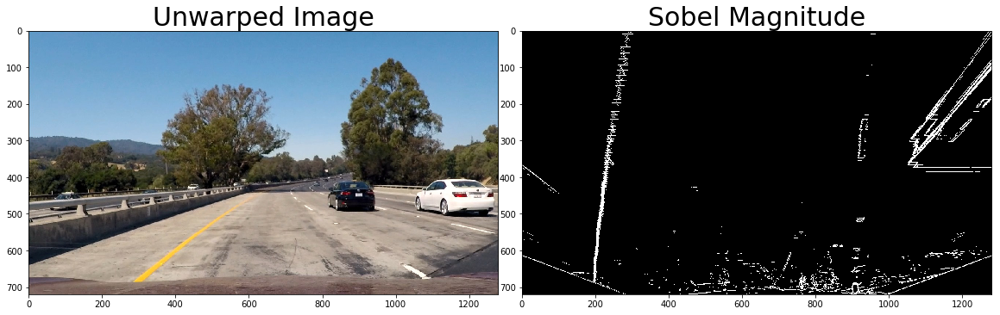

In [13]:
images = glob.glob('../test_images/test1.jpg')
fname = images[0]

img = mpimg.imread(fname)
# Undistort the image based on the camera calibration
undist = undistort(img, mtx, dist)
# warp the image
warped = warper(undist)


# plt.imshow(warped)
sobel = calc_sobel(warped)

# Visualize sobel magnitude threshold
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Unwarped Image', fontsize=30)
ax2.imshow(sobel, cmap='gray')
ax2.set_title('Sobel Magnitude', fontsize=30)

# Color Selection helper functions

Apply threshold funciton to take a channel and a threshold and return the binary image

In [14]:
def applyThreshold(channel, thresh):
    # Create an image of all zeros
    binary_output = np.zeros_like(channel)
    
    # Apply a threshold to the channel with inclusive thresholds 
    binary_output[(channel >= thresh[0]) & (channel <= thresh[1])] = 1
    
    return binary_output

RGB R threshold

In [15]:
def rgb_rthresh(img, thresh=(125, 255)):
    # Pull out the R channel - assuming that RGB was passed in
    channel = img[:,:,0]
    # Return the applied threshold binary image
    return applyThreshold(channel, thresh)

HLS S Threshold

In [16]:
def hls_sthresh(img, thresh=(125, 255)):
    # Convert to HLS
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Pull out the S channel
    channel = hls[:,:,2]
    # Return the applied threshold binary image
    return applyThreshold(channel, thresh)

B-channel of LAB

In [17]:
def lab_bthresh(img, thresh=(125, 255)):
    # Convert to HLS
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    # Pull out the B channel
    channel = lab[:,:,2]
    # Return the applied threshold binary image
    return applyThreshold(channel, thresh)

L-channel of LUV

In [18]:
def luv_lthresh(img, thresh=(125, 255)):
    # Convert to HLS
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
    # Pull out the L channel
    channel = luv[:,:,0]
    # Return the applied threshold binary image
    return applyThreshold(channel, thresh)

# Binary Pipeline Function

This function will process an image and return the binary image

In [19]:
def binaryPipeline(img, show_images=False,
                   sobel_kernel_size=7, 
                   sobel_thresh = (35, 50) , 
                   r_thresh=(225, 255),
                   s_thresh=(220, 250),
                   b_thresh=(175, 255),
                   l_thresh=(215,255)
                  ):    
    # Copy the image
    img2 = np.copy(img)

    # Undistort the image based on the camera calibration
    undist = undistort(img, mtx, dist)

    # warp the image based on our perspective transform
    warped = warper(undist)

    ### COLOR SELECTION
    # Get the Red and saturation images
    r = rgb_rthresh(warped, thresh=(r_thresh[0], r_thresh[1]))
    s = hls_sthresh(warped, thresh=(s_thresh[0], s_thresh[1]))
    b = lab_bthresh(warped, thresh=(b_thresh[0], b_thresh[1]))
    l = luv_lthresh(warped, thresh=(l_thresh[0], l_thresh[1]))

    ### EDGE DETECTION
    # Run the sobel magnitude calculation
    edge = calc_sobel(warped, sx=True, sobel_kernel=sobel_kernel_size, thresh=(sobel_thresh[0], sobel_thresh[1]))

    # Run canny edge detector
    #     edge = run_canny(warped, kernel_size=canny_kernel_size, low_thresh=canny_thresh_low, high_thresh=canny_thresh_high)
    ### Create plots if we want them
    if show_images:
        f, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(16, 7))
        f.tight_layout()
        ax1.set_title('r', fontsize=10)
        ax1.axis('off')
        ax1.imshow(r, cmap='gray')
        ax2.set_title('s', fontsize=15)
        ax2.axis('off')
        ax2.imshow(s, cmap='gray')
        ax3.set_title('b', fontsize=15)
        ax3.axis('off')
        ax3.imshow(b, cmap='gray')

        ax4.set_title('l', fontsize=15)
        ax4.axis('off')
        ax4.imshow(l, cmap='gray')

        ax5.set_title('sobel', fontsize=15)
        ax5.axis('off')
        ax5.imshow(edge, cmap='gray')

            # combine these layers
    combined_binary = np.zeros_like(r)
    combined_binary[ (r == 1) | (s == 1) | (b == 1) | (l == 1) | (edge == 1) ] = 1

    return combined_binary


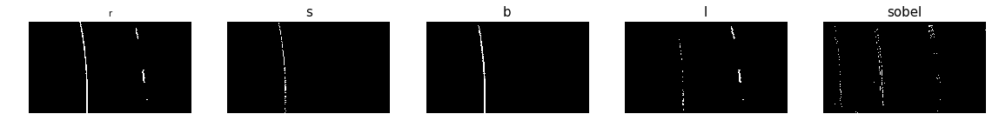

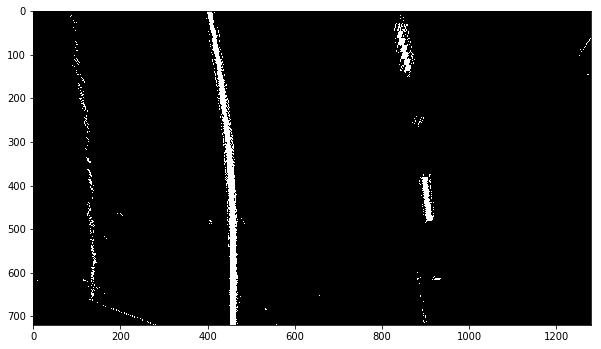

In [20]:

img = mpimg.imread('../test_images/test2.jpg')

combined = binaryPipeline(img, show_images=True)

plt.figure(figsize=(10,10))
plt.imshow(combined,cmap='gray')

# Test the pipeline on all our test images

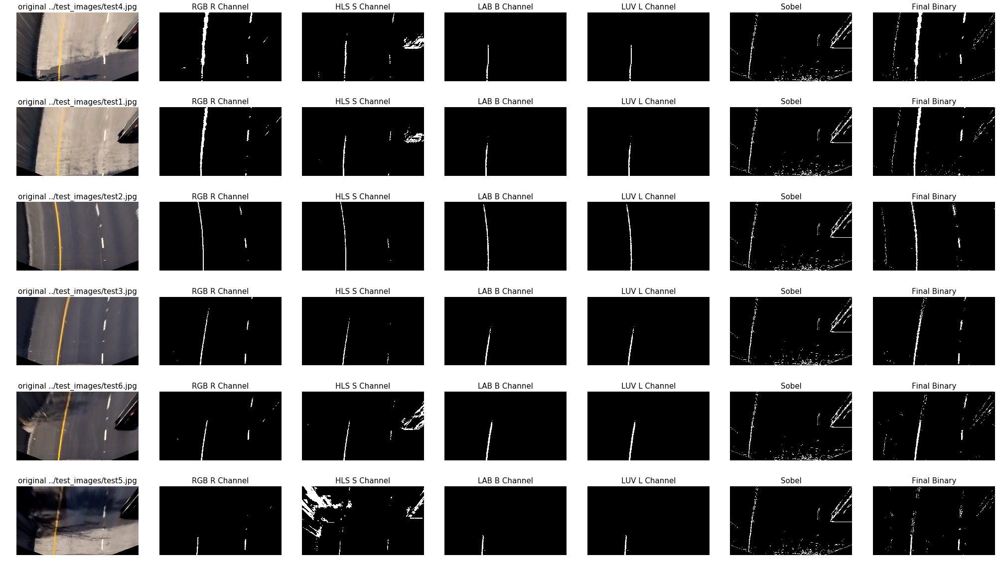

In [21]:
images = glob.glob('../test_images/test*.jpg')

f, axs = plt.subplots(6, 7, figsize=(28, 16))
f.tight_layout()
axs = axs.ravel()

i = 0
for fname in images:
    img = mpimg.imread(fname)
    
    # Run this through our binary pipeline
    combined = binaryPipeline(img, show_images=False)
    
    ### The below is just so we can see the makeup of the binary pipeline
    
    # Undistort the image based on the camera calibration
    undist = undistort(img, mtx, dist)

    # warp the image
    warped = warper(undist)
    
#    canny_kernel_size=5 
#    canny_thresh_low=50
#    canny_thresh_high=150

    r_thresh_low=225
    r_thresh_high=255

    s_thresh_low=200
    s_thresh_high=255

    b_thresh_low=175
    b_thresh_high=255

    l_thresh_low=225
    l_thresh_high=255
    
    # Get the Red and saturation images
    r = rgb_rthresh(warped, thresh=(r_thresh_low, r_thresh_high))
    s = hls_sthresh(warped, thresh=(s_thresh_low, s_thresh_high))
    b = lab_bthresh(warped, thresh=(b_thresh_low, b_thresh_high))
    l = luv_lthresh(warped, thresh=(l_thresh_low, l_thresh_high))
    
    axs[i].axis('off')
    axs[i].imshow(warped)
    axs[i].set_title('original ' + str(fname) , fontsize=15)
    i += 1
    axs[i].axis('off')
    axs[i].imshow(r, cmap='gray')
    axs[i].set_title('RGB R Channel', fontsize=15)
    i += 1
    axs[i].axis('off')
    axs[i].imshow(s, cmap='gray')
    axs[i].set_title('HLS S Channel', fontsize=15)
    i += 1
    axs[i].axis('off')
    axs[i].imshow(b, cmap='gray')
    axs[i].set_title('LAB B Channel', fontsize=15)
    i += 1
    axs[i].axis('off')
    axs[i].imshow(b, cmap='gray')
    axs[i].set_title('LUV L Channel', fontsize=15)
    i += 1
    axs[i].axis('off')
    axs[i].imshow(sobel, cmap='gray')
    axs[i].set_title('Sobel', fontsize=15)
    i += 1
    axs[i].axis('off')
    axs[i].imshow(combined, cmap='gray')
    axs[i].set_title('Final Binary', fontsize=15)
    i += 1

# Finding and Fitting Line Pixels

### Method 1

In [22]:
ym_per_pix = 3*8/720 # meters per pixel in y dimension, 8 lines (5 spaces, 3 lines) at 10 ft each = 3m
xm_per_pix = 3.7/550 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters

In [23]:
def calc_line_fits(img):

    ### Settings
    # Choose the number of sliding windows
    nwindows = 9
    # Set the width of the windows +/- margin
    margin = 100
    # Set minimum number of pixels found to recenter window
    minpix = 50


    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)

    #plt.figure()
    #plt.plot(histogram)
    
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((img, img, img))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(img.shape[0]/nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window+1)*window_height
        win_y_high = img.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds]
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit a second order polynomial to each
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)

    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

    return left_fit, right_fit, left_fit_m, right_fit_m, out_img


#### Test Method 1

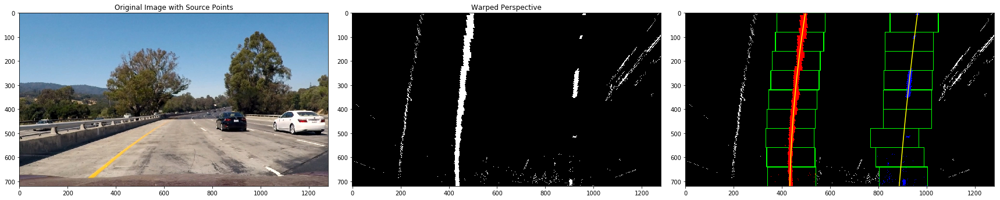

In [24]:
### get the test images from the test_images folder
images = glob.glob('../test_images/test1.jpg')


### Loop through each image and send it to the pipeline
for fname in images:
    
    img = mpimg.imread(fname)
    img_og = np.copy(img)
    
    # Run this through our binary pipeline
    binary_warped = binaryPipeline(img)
    
    # Run the warped, binary image from the pipeline through the fitter
    left_fit, right_fit, left_fit_m, right_fit_m, out_img = calc_line_fits(binary_warped)

    ### Plot the original image, the binary warped image, and the visualization from the fitter
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image with Source Points')
    
    ax2.imshow(binary_warped, cmap='gray')
    ax2.set_title('Warped Perspective')
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    ax3.imshow(out_img)
    ax3.plot(left_fitx, ploty, color='yellow')
    ax3.plot(right_fitx, ploty, color='yellow')

### Method 2

Use a previous fit

In [25]:
def calc_line_fits_from_prev(img, leftLine, rightLine):

    left_fit = leftLine.best_fit_px
    right_fit = rightLine.best_fit_px
    
    ### Settings
    margin = 100 # Width on either side of the fitted line to search

    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])

    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin))) 
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit a second order polynomial to each in meters
    left_fit_m = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_m = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
       # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Color in left and right line pixels
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)

    return left_fit, right_fit, left_fit_m, right_fit_m, result

### Need a line class for this previous fit method

keep track of the current and past line data.

In [26]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        
        # was the line detected in the last iteration?
        self.detected = False  
        
        # polynomial coefficients averaged over the last n iterations
        self.best_fit_px = None
        self.best_fit_m = None
        
        #polynomial coefficients for the most recent fit
        self.current_fit_px = None  
        self.current_fit_m = None
        
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        
        # center position of car
        self.lane_to_camera = None
        
        # Previous Fits
        self.previous_fits_px = []
        self.previous_fits_m = []
        
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float')
        
        # meters per pixel in y dimension
        self.ym_per_pix = 30/720
        
        # y_eval is where we want to evaluate the fits for the line radius calcuation 
        # for us it's at the bottom of the image for us, and because we know 
        # the size of our video/images we can just hardcode it
        self.y_eval = 720. * self.ym_per_pix
        
                # camera position is where the camera is located relative to the image
        # we're assuming it's in the middle
        self.camera_position = 640.

    def run_line_pipe(self):
        self.calc_best_fit()
        self.calc_radius()
        
    def add_new_fit(self, new_fit_px, new_fit_m):
        """
        Add a new fit to the Line class
        """
        
        # If this is our first line, then we will have to take it
        if self.current_fit_px == None and self.previous_fits_px == []:
            self.detected = True
            self.current_fit_px = new_fit_px
            self.current_fit_m = new_fit_m
            self.run_line_pipe()
            return
        else:
            # measure the diff to the old fit
            self.diffs = np.abs(new_fit_px - self.current_fit_px)
            # check the size of the diff
            if self.diff_check():
                print("Found a fit diff that was too big")
                print(self.diffs)
                self.defected = False
                return
            self.detected = True
            self.current_fit_px = new_fit_px
            self.current_fit_m = new_fit_m
            self.run_line_pipe()
            return

    def diff_check(self):
        if self.diffs[0] > 0.001:
            return True
        if self.diffs[1] > 0.25:
            return True
        if self.diffs[2] > 1000.:
            return True
        return False

    def calc_best_fit(self):
        """
        calculate the average, if needed
        """
        # add the latest fit to the previous fit list
        self.previous_fits_px.append(self.current_fit_px)
        self.previous_fits_m.append(self.current_fit_m)
        
        # If we currently have 5 fits, throw the oldest out
        if len(self.previous_fits_px) > 5:
            self.previous_fits_px = self.previous_fits_px[1:]
        if len(self.previous_fits_m) > 5:
            self.previous_fits_m = self.previous_fits_m[1:]
        
        # Just average everything
        self.best_fit_px = np.average(self.previous_fits_px, axis=0)
        self.best_fit_m = np.average(self.previous_fits_m, axis=0)
        return
        
        
    def calc_radius(self):
        """
        left_fit and right_fit are assumed to have already been converted to meters
        """
        y_eval = self.y_eval
        fit = self.best_fit_m

        curve_rad = ((1 + (2*fit[0]*y_eval + fit[1])**2)**1.5) / np.absolute(2*fit[0])
        self.radius_of_curvature = curve_rad
        return
    

/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py:51: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.


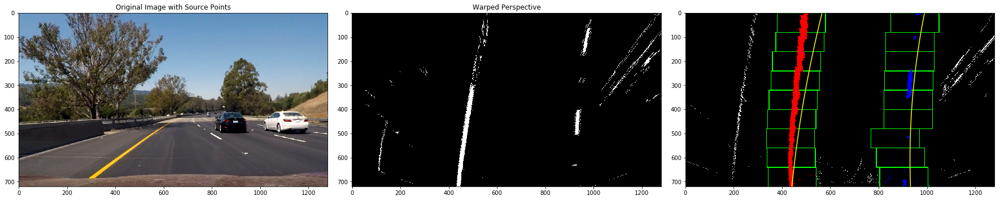

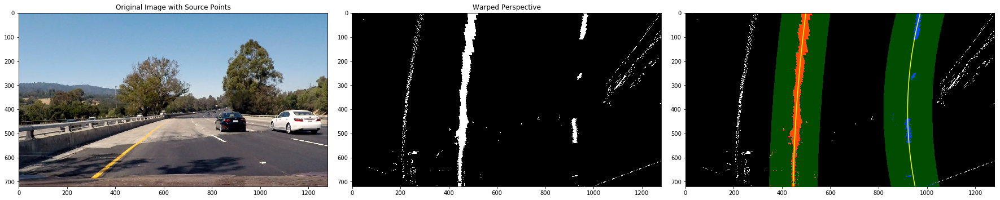

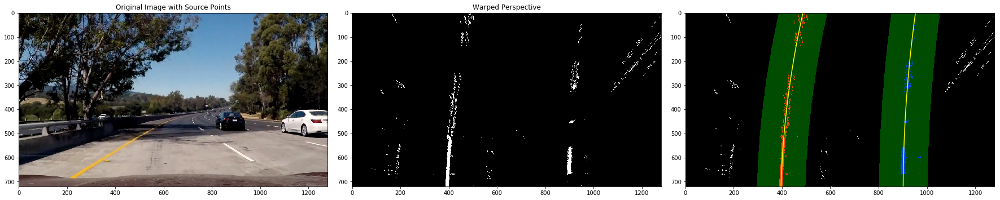

In [27]:
images = ['../test_images/test6.jpg', '../test_images/test4.jpg', '../test_images/test5.jpg']

leftLine = Line()
rightLine = Line()

### Loop through each image and send it to the pipeline
for fname in images:
    
    img = mpimg.imread(fname)
    img_og = np.copy(img)
    
    # Run this through our binary pipeline
    binary_warped = binaryPipeline(img)
    
    ## I know that test 6 is the first image, so use the calc_line_fits on that image,
    ## otherwise use the calc_line_fits_from_prev function to test it.
    if fname == '../test_images/test6.jpg':
    
        # Run the warped, binary image from the pipeline through the fitter
        left_fit, right_fit, left_fit_m, right_fit_m, result = calc_line_fits(binary_warped)

        # Add these fits to the line classes
        leftLine.add_new_fit(left_fit, left_fit_m)
        rightLine.add_new_fit(right_fit, left_fit_m)
        
        ### Plot the original image, the binary warped image, and the visualization from the fitter
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image with Source Points')

        ax2.imshow(binary_warped, cmap='gray')
        ax2.set_title('Warped Perspective')

        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        ax3.imshow(out_img)
        ax3.plot(left_fitx, ploty, color='yellow')
        ax3.plot(right_fitx, ploty, color='yellow')

        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    else:
    
        left_fit, right_fit, left_inds, right_inds, result = calc_line_fits_from_prev(binary_warped, leftLine, rightLine)
        
        # Add these fits to the line classes
        leftLine.add_new_fit(left_fit, left_fit_m)
        rightLine.add_new_fit(right_fit, left_fit_m)
        
        # Generate x and y values for plotting
        ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        
        ### Plot the original image, the binary warped image, and the visualization from the fitter
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image with Source Points')

        ax2.imshow(binary_warped, cmap='gray')
        ax2.set_title('Warped Perspective')

        ax3.imshow(result)
        ax3.plot(left_fitx, ploty, color='yellow')
        ax3.plot(right_fitx, ploty, color='yellow')

        plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)        
        

# Lane Center Functions

In [28]:
def get_center_dist(leftLine, rightLine):
    
    # grab the x and y fits at px 700 (slightly above the bottom of the image)
    y = 700.
    image_center = 640. * xm_per_pix
    
    leftPos = leftLine.best_fit_px[0]*(y**2) + leftLine.best_fit_px[1]*y + leftLine.best_fit_px[2]
    rightPos = rightLine.best_fit_px[0]*(y**2) + rightLine.best_fit_px[1]*y + rightLine.best_fit_px[2]
    lane_middle = int((rightPos - leftPos)/2.)+leftPos
    lane_middle = lane_middle * xm_per_pix
    
    mag = lane_middle - image_center
    if (mag > 0):
        head = "Right"
    else:
        head = "Left"
            
    return head, mag

def combine_radii(leftLine, rightLine):
    
    left = leftLine.radius_of_curvature
    right = rightLine.radius_of_curvature
    
    return np.average([left, right])

# Final Image Creation

Create the final image with the lane overlay, and add the image text

In [29]:
def create_final_image(img, binary_warped, leftLine, rightLine, show_images=False):
    
    left_fit = leftLine.best_fit_px
    right_fit = rightLine.best_fit_px
    
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (127, 255, 212)) 
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,69, 0), thickness=20)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(255,69, 0), thickness=20)
    
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = unwarp(color_warp)
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.5, 0)
    
    if show_images:
        plt.figure(figsize=(9,9))
        plt.imshow(color_warp)
        
        plt.figure(figsize=(9,9))
        plt.imshow(result)
    
    return result

In [30]:
def add_image_text(img, radius, head, center):
    
    # Add the radius and center position to the image
    font = cv2.FONT_HERSHEY_DUPLEX
    
    text = 'Radius of curvature: ' + '{:04.0f}'.format(radius) + 'm'
    cv2.putText(img, text, (50,100), font, 1.5, (255 ,99, 71), 2, cv2.LINE_AA)

    text = '{:03.2f}'.format(abs(center)) + 'm '+ head + ' of center'
    cv2.putText(img, text, (50,175), font, 1.5, (255 ,99, 71), 2, cv2.LINE_AA)
    
    return img

# Final Image Pipeline

In [31]:
def final_pipeline(img):
    
    img_og = np.copy(img)
    
    # Undistort the image based on the camera calibration
    undist = undistort(img, mtx, dist)
    
    # warp the image based on our perspective transform
    warped = warper(undist)
    
    # Run this through our binary pipeline
    binary_warped = binaryPipeline(img)
    
    # If we found lines previously, run the simplified line fitter
    if leftLine.detected == True and rightLine.detected == True:
        left_fit, right_fit, left_fit_m, right_fit_m, out_img = calc_line_fits_from_prev(binary_warped, leftLine, rightLine)
    else:
        # Run the warped, binary image from the pipeline through the complex fitter
        left_fit, right_fit, left_fit_m, right_fit_m, out_img = calc_line_fits(binary_warped)
    
    
    # Add these fits to the line classes
    leftLine.add_new_fit(left_fit, left_fit_m)
    rightLine.add_new_fit(right_fit, left_fit_m)
    
    # get radius and center distance
    curve_rad = combine_radii(leftLine, rightLine)
    head, center = get_center_dist(leftLine, rightLine)

    # create the final image
    result = create_final_image(img, binary_warped, leftLine, rightLine)
    
    # add the text to the image 
    result = add_image_text(result, curve_rad, head, center)
    
    return result

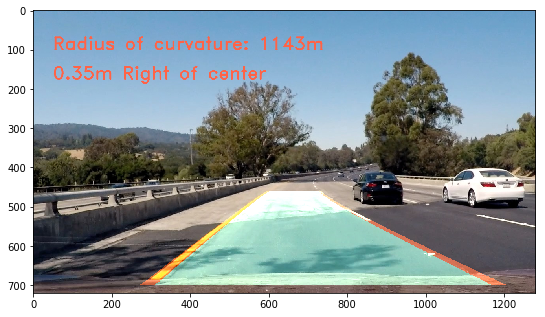

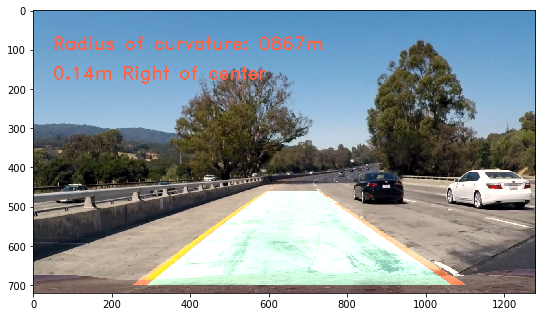

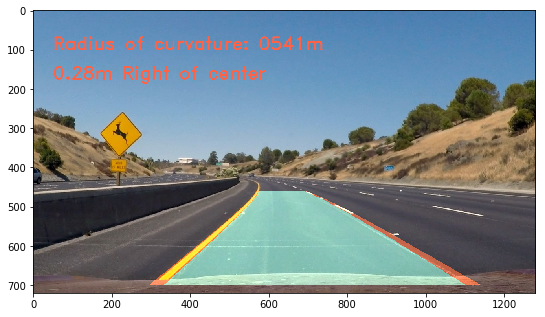

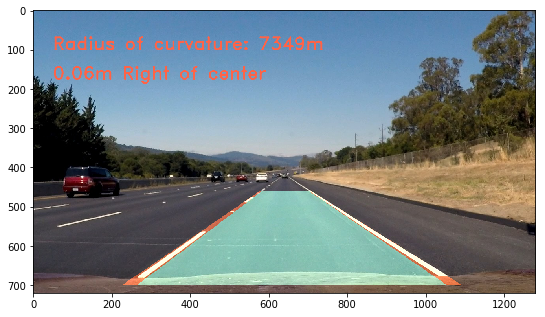

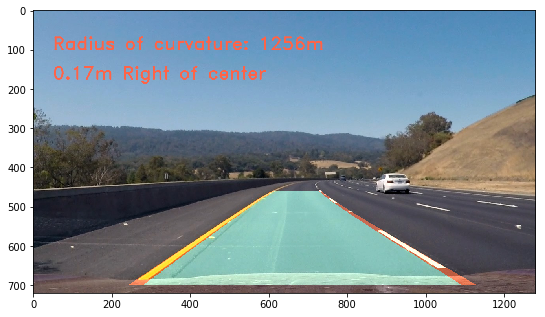

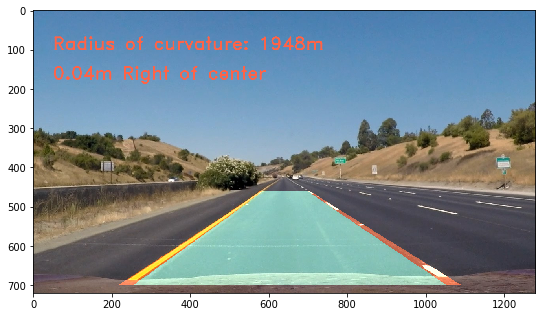

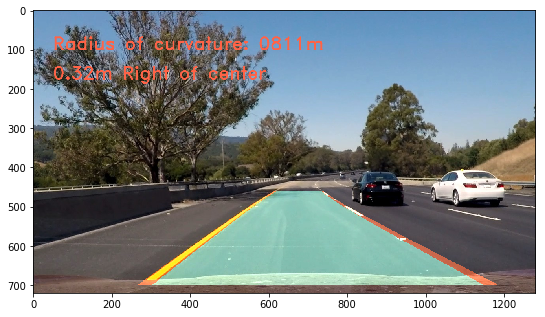

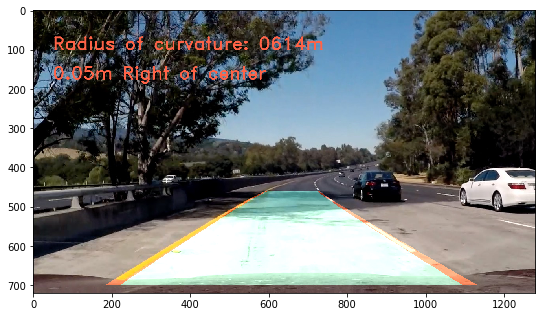

In [32]:
images = glob.glob('../test_images/*.jpg')

### Loop through each image and send it to the pipeline
for fname in images:
    
    # Initialize two lines for left and right on every image since the images don't
    # come from a continous video
    rightLine = Line()
    leftLine = Line()
    
    # Read the image
    img = mpimg.imread(fname)
    
    # Run the image through the pipeline
    result = final_pipeline(img)

    # Let's plot the image
    plt.figure(figsize=(9,9))
    plt.imshow(result)

In [33]:
# Video processing
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [39]:
leftLine = Line()
rightLine = Line()

output = '../project_video_output.mp4'
clip1 = VideoFileClip("../project_video.mp4")
clip = clip1.fl_image(final_pipeline)
%time clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video ../project_video_output.mp4
[MoviePy] Writing video ../project_video_output.mp4


 46%|████▌     | 583/1261 [03:12<04:02,  2.80it/s]

Found a fit diff that was too big
[  2.23813794e-04   2.55288902e-01   7.11233279e+01]


 46%|████▋     | 584/1261 [03:12<04:06,  2.75it/s]

Found a fit diff that was too big
[  4.53815499e-04   5.09194734e-01   1.38086160e+02]


 46%|████▋     | 585/1261 [03:13<03:57,  2.85it/s]

Found a fit diff that was too big
[  4.62604568e-04   5.47196459e-01   1.58987951e+02]


 46%|████▋     | 586/1261 [03:13<03:55,  2.87it/s]

Found a fit diff that was too big
[  4.01904029e-04   4.81470003e-01   1.39603023e+02]


 47%|████▋     | 587/1261 [03:13<03:54,  2.88it/s]

Found a fit diff that was too big
[  3.93823793e-04   4.78735762e-01   1.42231291e+02]


 47%|████▋     | 588/1261 [03:14<03:50,  2.92it/s]

Found a fit diff that was too big
[  2.51318867e-04   3.09685207e-01   9.10463995e+01]


 47%|████▋     | 591/1261 [03:15<03:44,  2.98it/s]

Found a fit diff that was too big
[  2.56108753e-04   3.04249403e-01   9.11649160e+01]


 47%|████▋     | 592/1261 [03:15<03:41,  3.01it/s]

Found a fit diff that was too big
[  3.40665813e-04   3.94773068e-01   1.14772918e+02]


 47%|████▋     | 593/1261 [03:15<03:44,  2.97it/s]

Found a fit diff that was too big
[  4.51687627e-04   5.21345087e-01   1.52083315e+02]


 47%|████▋     | 594/1261 [03:16<03:46,  2.94it/s]

Found a fit diff that was too big
[  4.22274369e-04   5.01100120e-01   1.51254520e+02]


 47%|████▋     | 595/1261 [03:16<03:47,  2.93it/s]

Found a fit diff that was too big
[  4.31458590e-04   5.14562904e-01   1.55141643e+02]


 82%|████████▏ | 1037/1261 [05:44<01:17,  2.90it/s]

Found a fit diff that was too big
[  3.99998983e-04   2.95067536e-01   1.60469279e+01]


 82%|████████▏ | 1038/1261 [05:44<01:17,  2.89it/s]

Found a fit diff that was too big
[  6.55432803e-04   4.40204722e-01   3.54892435e+01]


 82%|████████▏ | 1039/1261 [05:45<01:17,  2.87it/s]

Found a fit diff that was too big
[  8.59373591e-04   6.16209957e-01   6.53454708e+01]


 82%|████████▏ | 1040/1261 [05:45<01:17,  2.87it/s]

Found a fit diff that was too big
[  1.10408061e-03   7.91110185e-01   9.13909014e+01]


 83%|████████▎ | 1041/1261 [05:45<01:17,  2.83it/s]

Found a fit diff that was too big
[  8.55562083e-04   6.76391030e-01   9.05077093e+01]


 83%|████████▎ | 1042/1261 [05:46<01:17,  2.82it/s]

Found a fit diff that was too big
[  5.40632389e-04   4.58768320e-01   7.24656155e+01]


 83%|████████▎ | 1043/1261 [05:46<01:15,  2.90it/s]

Found a fit diff that was too big
[  5.39131849e-04   4.76927205e-01   8.10649411e+01]


 83%|████████▎ | 1044/1261 [05:46<01:13,  2.94it/s]

Found a fit diff that was too big
[  4.39665462e-04   4.48224182e-01   8.90501239e+01]


 83%|████████▎ | 1045/1261 [05:47<01:12,  2.96it/s]

Found a fit diff that was too big
[  2.69420111e-04   3.27361104e-01   8.36105568e+01]


 99%|█████████▉| 1246/1261 [06:56<00:05,  2.91it/s]

Found a fit diff that was too big
[  5.18436388e-04   3.86752276e-01   5.33195425e+01]


100%|█████████▉| 1260/1261 [07:01<00:00,  3.03it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ../project_video_output.mp4 

CPU times: user 4min 45s, sys: 3.35 s, total: 4min 48s
Wall time: 7min 4s


In [40]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))